<h1>Music Genre Classification</h1>

<h2>configuration</h2>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline

from time import time

import librosa
import librosa.display
import IPython.display as ipd

In [2]:
#CONFIG
path = './audio_data' # Input audio data root directory path
outfile_path = "data.csv" # Output path for extracted features

NUMBER_OF_MFCC = 20 # Mel coefficients
N_FFT = 2048  # Fourier Transform Settings
HOP_LENGTH = 512 # Hop length on audio

In [3]:
import os
genres = list(os.listdir(f'{path}'))
print(genres)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


<h2>Audio Exploration and Visualizations</h2>

In [4]:
#Load the audio file
y_sig, sr_viz = librosa.load(f'{path}/reggae/reggae.00036.wav')

print('y:', y_sig, '\n')
print('Datatype of y:', type(y_sig))
print('Datatype of sr:', type(sr_viz), '\n')
print('y shape:', np.shape(y_sig), '\n')
print('Sampling Rate (Hz):', sr_viz, '\n')

#Verify the length of the audio
audio_length_seconds = np.shape(y_sig)[0] / sr_viz
print('Checking the length of the audio:', audio_length_seconds)
ipd.Audio(f'{path}/reggae/reggae.00036.wav')

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Datatype of y: <class 'numpy.ndarray'>
Datatype of sr: <class 'int'> 

y shape: (661794,) 

Sampling Rate (Hz): 22050 

Checking the length of the audio: 30.013333333333332


In [5]:
#Trimming any leading or trailing silences from the audio
yt, index = librosa.effects.trim(y_sig)

#Printing the durations
print('Durations before and after trimming:\n')
print('Before:', librosa.get_duration(y=y_sig, sr=sr_viz), 'After:', librosa.get_duration(y=yt, sr=sr_viz), '\n')

print('Audio File:', yt, '\n')
print('Audio File shape:', np.shape(yt))

Durations before and after trimming:

Before: 30.013333333333332 After: 30.013333333333332 

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


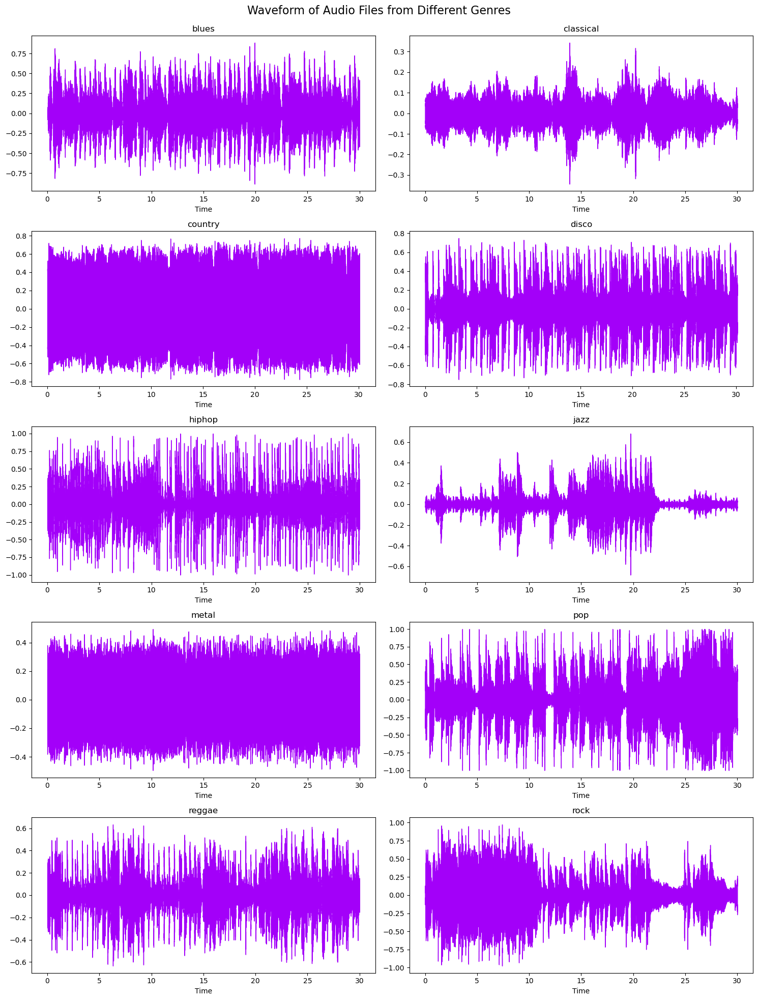

In [6]:
#Creating a figure and axes for subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

#Initializing row and column indices
i = 0
j = 0

#Iterate over each genre
for genre in genres:
    #Reading the first audio file
    path = f"audio_data/{genre}/{genre}.00000.wav"
    y_sig, sampling_rate_viz = librosa.load(path)
    
    #Plotting the waveform
    librosa.display.waveshow(y=y_sig, sr=sampling_rate_viz, color="#A300F9", ax=axes[i][j])
    axes[i][j].set_title(genre)
    
    #Updating row and column indices for the next subplot
    if j == 1:
        i += 1
        j = 0
    else:
        j += 1

#Adjusting layout and display the plot
plt.suptitle("Waveform of Audio Files from Different Genres\n", fontsize=16)
plt.tight_layout()
plt.show()

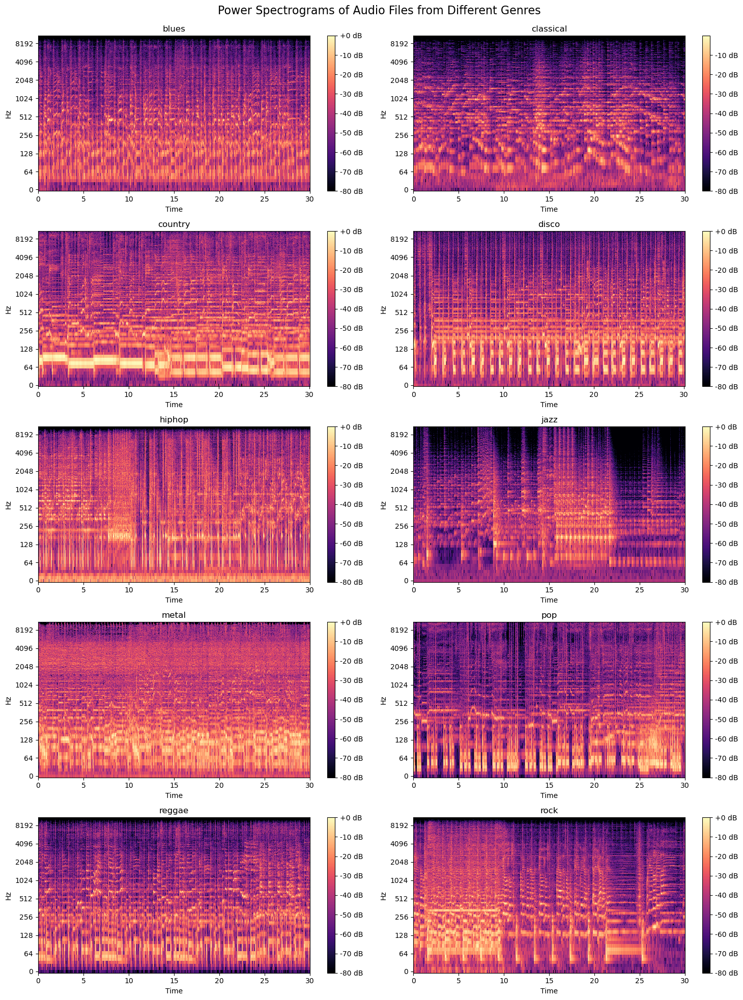

In [7]:
#Default FFT window size
vis_n_fft = 2048
vis_hop_length = 512

#Creating a figure and axes for subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

#Initializing row and column indices
i = 0
j = 0

#Iterating over each genre
for genre in genres:
    #Reading the first audio file
    file = f"audio_data/{genre}/{genre}.00000.wav"
    y_sig, sampling_rate_viz = librosa.load(file)
    
    #Computing the short-time Fourier transform (STFT)
    stft_data = np.abs(librosa.stft(y=y_sig, n_fft=vis_n_fft, hop_length=vis_hop_length))
    
    #Convert the amplitude spectrogram to Decibels-scaled spectrogram
    DB_viz = librosa.amplitude_to_db(stft_data, ref=np.max)

    #Display the spectrogram
    img = librosa.display.specshow(DB_viz, sr=sampling_rate_viz, hop_length=vis_hop_length, x_axis='time', y_axis='log', ax=axes[i][j])
    fig.colorbar(img, ax=axes[i][j], format="%+2.0f dB")

    axes[i][j].set_title(genre)

    #Update row and column indices for the next subplot
    if j == 1:
        i += 1
        j = 0
    else:
        j += 1

# Adjust layout and display the plot
plt.suptitle("Power Spectrograms of Audio Files from Different Genres\n", fontsize=16)
plt.tight_layout()
plt.show()

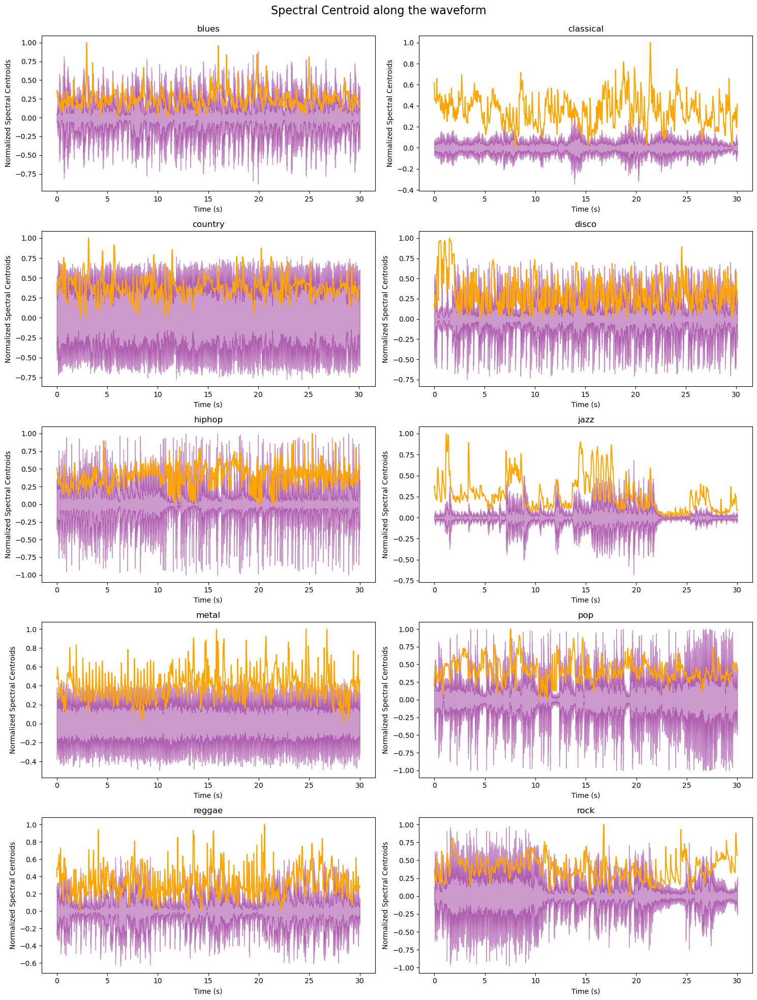

In [8]:
#Creating a figure and axes for subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

#Initializing row and column indices
i = 0
j = 0

#Iterate over each genre
for genre in genres:
    #Reading the first audio file
    path = f"audio_data/{genre}/{genre}.00000.wav"
    y_sig, sampling_rate_viz = librosa.load(path)

    #Calculating the spectral centroids
    spectral_centroids = librosa.feature.spectral_centroid(y=y_sig, sr=sampling_rate_viz)[0]
    
    # Computing the time variable for visualization
    frames_viz = range(len(spectral_centroids))

    #Converts frame counts to time (seconds)
    ti = librosa.frames_to_time(frames_viz)
    
    #Plotting the waveform
    librosa.display.waveshow(y=y_sig, sr=sampling_rate_viz, alpha=0.4, color = 'purple',ax=axes[i][j])
    axes[i][j].plot(ti, sklearn.preprocessing.minmax_scale(spectral_centroids, axis=0), color='orange')
    axes[i][j].set_title(genre)

    # Adding x and y labels
    axes[i][j].set_xlabel('Time (s)')
    axes[i][j].set_ylabel('Normalized Spectral Centroids')
    
    #Updating row and column indices for the next subplot
    if j == 1:
        i += 1
        j = 0
    else:
        j += 1

#Adjusting layout and display the plot
plt.suptitle("Spectral Centroid along the waveform\n", fontsize=16)
plt.tight_layout()
plt.show()

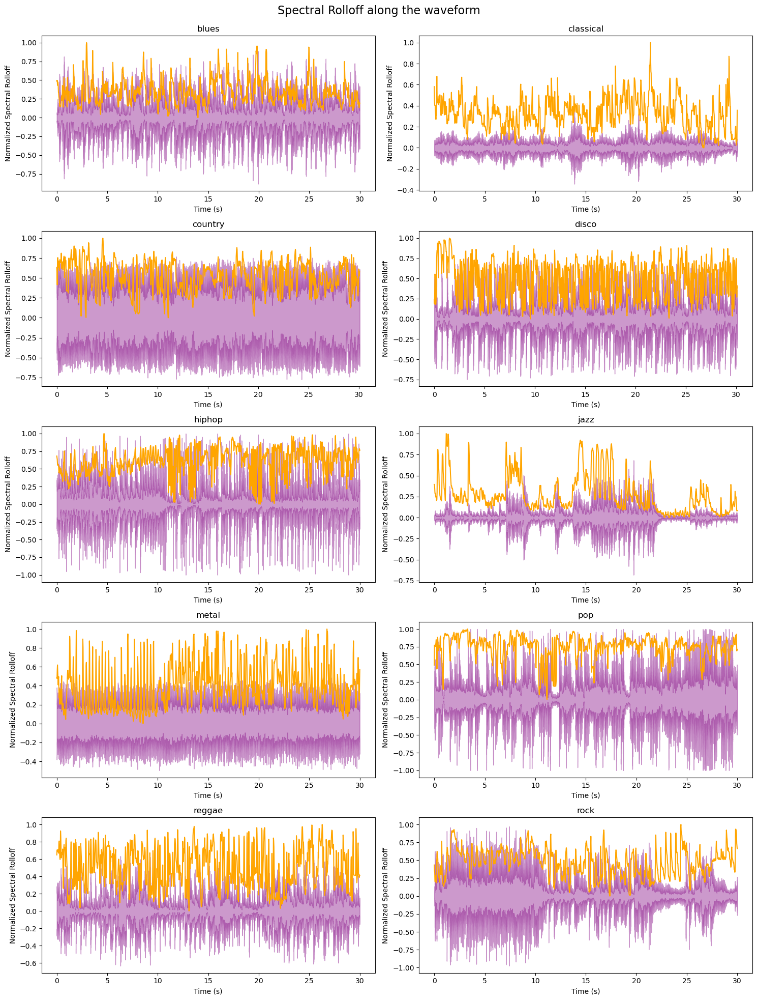

In [9]:
#Creating a figure and axes for subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

#Initializing row and column indices
i = 0
j = 0

#Iterate over each genre
for genre in genres:
    #Reading the first audio file
    file = f"audio_data/{genre}/{genre}.00000.wav"
    y_sig, sampling_rate_viz = librosa.load(file)

    #Calculating the spectral rolloffs
    spectral_rolloff_viz = librosa.feature.spectral_rolloff(y=y_sig, sr=sampling_rate_viz)[0]
    
    # Computing the time variable for visualization
    frames_viz = range(len(spectral_rolloff_viz))

    #Converts frame counts to time (seconds)
    ti = librosa.frames_to_time(frames_viz)
    
    #Plotting the waveform
    librosa.display.waveshow(y=y_sig, sr=sampling_rate_viz, alpha=0.4, color = 'purple',ax=axes[i][j])
    axes[i][j].plot(ti, sklearn.preprocessing.minmax_scale(spectral_rolloff_viz, axis=0), color='orange')
    axes[i][j].set_title(genre)

    # Adding x and y labels
    axes[i][j].set_xlabel('Time (s)')
    axes[i][j].set_ylabel('Normalized Spectral Rolloff')
    
    #Updating row and column indices for the next subplot
    if j == 1:
        i += 1
        j = 0
    else:
        j += 1

#Adjusting layout and display the plot
plt.suptitle("Spectral Rolloff along the waveform\n", fontsize=16)
plt.tight_layout()
plt.show()

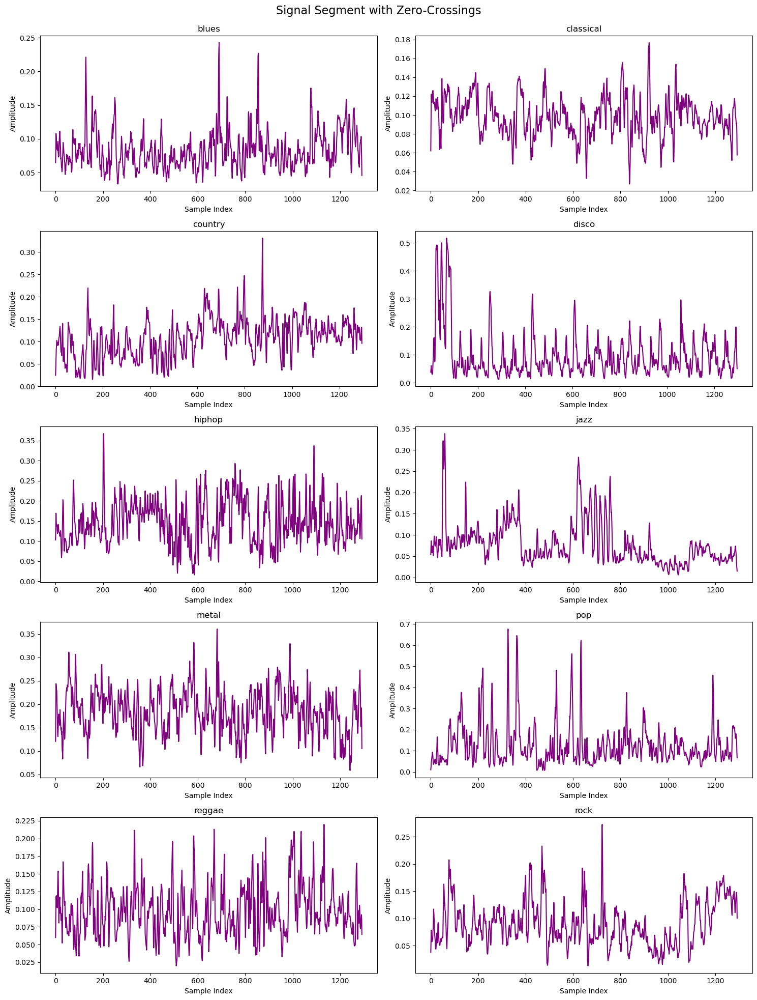

In [10]:
fig, axes= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genres:
    
    # Reading the first audio file
    file = f"audio_data/{genre}/{genre}.00000.wav"
    y_sig, sampling_rate_viz = librosa.load(file)
    
    zero_crossing_rate_viz = librosa.feature.zero_crossing_rate(y=y_sig, hop_length = vis_hop_length)[0]

    #Plot
    axes[i][j].plot(zero_crossing_rate_viz,color = "purple")
    axes[i][j].set_title(genre)

    # Adding x and y labels
    axes[i][j].set_xlabel("Sample Index")
    axes[i][j].set_ylabel("Amplitude")

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.suptitle("Signal Segment with Zero-Crossings\n", fontsize=16)
plt.tight_layout()
plt.show()

In [11]:
#Defining the start and end points for the segment
start_seg = 1000
end_seg = 1200

#Calculating the zero-crossing rate for reggae.00036.wav in the above defined segment
zero_cross_rate_viz = librosa.zero_crossings(yt[start_seg:end_seg], pad=False)

#Counting the number of zero crossings
num_zero_crossings_viz = sum(zero_cross_rate_viz)
print("The number of zero crossings is:", num_zero_crossings_viz)

The number of zero crossings is: 20


<h2>Feature Extraction from audio data</h2>

In [12]:
import multiprocessing as mp
import dask
from dask import dataframe as dd
from dask import delayed, compute
from dask.system import CPU_COUNT
from dask.distributed import LocalCluster, Client  # For distributed schedulers
from dask.diagnostics import Profiler, ResourceProfiler, CacheProfiler, visualize

<h3> Feature Extraction Pipeline </h3>

In [13]:
# Configuration constants

path = './audio_data' # Input audio data root directory path
outfile_path = "data.csv" # Output path for extracted features

NUMBER_OF_MFCC = 20
N_FFT = 2048
HOP_LENGTH = 512
BLOCK_LENGTH = 11
FRAME_LENGTH = 6616
HOP_LENGTH_STREAM = 6615

def extract_features(trial_audio_file_path: str) -> pd.DataFrame:
    #Extracting features for each chunk of the audio file
    # print("Started processing file")
    df0 = extract_features_per_chunk(trial_audio_file_path)
    # print("Ended processing file")
    #Concatenate dataframes
    df0 = pd.concat(df0)
    return df0

def extract_features_per_chunk(audio_file_path):
    stream = librosa.stream(audio_file_path, block_length=BLOCK_LENGTH, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH_STREAM)
    processed_chunks = []
    for i, y_block in enumerate(stream):
        #Trimming starting and trailing silences
        y_trimmed, _ = librosa.effects.trim(y_block)
        #Extracting features from trimmed audio
        df = extract_feature_means(y_block, f'{audio_file_path}.{i}', 22050)
        df['label'] = audio_file_path.split("/")[-2]
        processed_chunks.append(df)
    return processed_chunks

def extract_feature_means(signal, audio_file_path, sr) -> pd.DataFrame:
    n_fft = N_FFT
    hop_length = HOP_LENGTH

    #Computing Short-time Fourier Transform (STFT) and spectrograms
    d_audio = np.abs(librosa.stft(signal, n_fft=n_fft, hop_length=hop_length))
    db_audio = librosa.amplitude_to_db(d_audio, ref = np.max)
    #Extracting harmonic and percussive components
    y_harm, y_perc = librosa.effects.hpss(signal)
    #Computing spectral centroids
    spectral_centroids = librosa.feature.spectral_centroid(y=signal, sr=sr)[0]
    spectral_centroids_delta = librosa.feature.delta(spectral_centroids)
    spectral_centroids_accelerate = librosa.feature.delta(spectral_centroids, order=2)
    #Computing chroma features
    chromagram = librosa.feature.chroma_stft(y=signal, sr=sr, hop_length=hop_length)
    #Computing tempo (beats per minute) and spectral rolloff
    tempo_y, _ = librosa.beat.beat_track(y=signal, sr=sr)
    spectral_rolloff = librosa.feature.spectral_rolloff(y=signal, sr=sr)[0]
    #Computing spectral flux and spectral bandwidth
    onset_env = librosa.onset.onset_strength(y=signal, sr=sr)
    spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y=signal, sr=sr)[0]
    spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y=signal, sr=sr, p=3)[0]
    spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y=signal, sr=sr, p=4)[0]
    #Computing the Mel Spectrograms
    s_audio = librosa.feature.melspectrogram(y=signal, sr=sr)
    s_db_audio = librosa.amplitude_to_db(s_audio, ref=np.max)
    #Creating a dictionary to store audio features
    audio_features = {
        "file_name": audio_file_path,
        "zero_crossing_rate_mean": np.mean(librosa.feature.zero_crossing_rate(y=signal)[0]),
        "zero_crossings_mean": np.sum(librosa.zero_crossings(y=signal, pad=False)),
        "spectrogram_mean": np.mean(db_audio[0]),
        "mel_spectrogram_mean": np.mean(s_db_audio[0]),
        "harmonics_mean": np.mean(y_harm),
        "perceptual_shock_wave_mean": np.mean(y_perc),
        "spectral_centroids_mean": np.mean(spectral_centroids),
        "spectral_centroids_delta_mean": np.mean(spectral_centroids_delta),
        "spectral_centroids_accelerate_mean": np.mean(spectral_centroids_accelerate),
        "chroma1_mean": np.mean(chromagram[0]),
        "chroma2_mean": np.mean(chromagram[1]),
        "chroma3_mean": np.mean(chromagram[2]),
        "chroma4_mean": np.mean(chromagram[3]),
        "chroma5_mean": np.mean(chromagram[4]),
        "chroma6_mean": np.mean(chromagram[5]),
        "chroma7_mean": np.mean(chromagram[6]),
        "chroma8_mean": np.mean(chromagram[7]),
        "chroma9_mean": np.mean(chromagram[8]),
        "chroma10_mean": np.mean(chromagram[9]),
        "chroma11_mean": np.mean(chromagram[10]),
        "chroma12_mean": np.mean(chromagram[11]),
        "tempo_bpm": tempo_y,
        "spectral_rolloff_var": np.var(spectral_rolloff),
        "spectral_flux_var": np.var(onset_env),
        "spectral_bandwidth_2_var": np.var(spectral_bandwidth_2),
        "spectral_bandwidth_3_var": np.var(spectral_bandwidth_3),
        "spectral_bandwidth_4_var": np.var(spectral_bandwidth_4),
        "zero_crossing_rate_var": np.var(librosa.feature.zero_crossing_rate(y=signal)[0]),
        "zero_crossings_var": np.var(librosa.zero_crossings(y=signal, pad=False)),
        "spectrogram_var": np.var(db_audio[0]),
        "mel_spectrogram_var": np.var(s_db_audio[0]),
        "harmonics_var": np.var(y_harm),
        "perceptual_shock_wave_var": np.var(y_perc),
        "spectral_centroids_var": np.var(spectral_centroids),
        "spectral_centroids_delta_var": np.var(spectral_centroids_delta),
        "spectral_centroids_accelerate_var": np.var(spectral_centroids_accelerate),
        "chroma1_var": np.var(chromagram[0]),
        "chroma2_var": np.var(chromagram[1]),
        "chroma3_var": np.var(chromagram[2]),
        "chroma4_var": np.var(chromagram[3]),
        "chroma5_var": np.var(chromagram[4]),
        "chroma6_var": np.var(chromagram[5]),
        "chroma7_var": np.var(chromagram[6]),
        "chroma8_var": np.var(chromagram[7]),
        "chroma9_var": np.var(chromagram[8]),
        "chroma10_var": np.var(chromagram[9]),
        "chroma11_var": np.var(chromagram[10]),
        "chroma12_var": np.var(chromagram[11]),
        "spectral_rolloff_var": np.var(spectral_rolloff),
        "spectral_flux_var": np.var(onset_env),
        "spectral_bandwidth_2_var": np.var(spectral_bandwidth_2),
        "spectral_bandwidth_3_var": np.var(spectral_bandwidth_3),
        "spectral_bandwidth_4_var": np.var(spectral_bandwidth_4),
    }
    #Extracting MFCC features
    mfcc_df = extract_mfcc_feature_means(audio_file_path, signal, sample_rate=sr, number_of_mfcc=NUMBER_OF_MFCC)

    #Combining audio features and MFCC features into a single dataframe
    df = pd.DataFrame.from_records(data=[audio_features])
    df = pd.merge(df, mfcc_df, on='file_name')
    return df

def extract_mfcc_feature_means(audio_file_name: str, signal: np.ndarray, sample_rate: int, number_of_mfcc: int) -> pd.DataFrame:
    #Computing MFCC features
    mfcc_alt = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=number_of_mfcc)
    delta = librosa.feature.delta(mfcc_alt)
    accelerate = librosa.feature.delta(mfcc_alt, order=2)

    #Creating a dictionary to store MFCC features
    mfcc_features = {"file_name": audio_file_name}
    for i in range(0, number_of_mfcc):
        mfcc_features[f'mfcc{i}_mean'] = np.mean(mfcc_alt[i])
        mfcc_features[f'mfcc_delta_{i}_mean'] = np.mean(delta[i])
        mfcc_features[f'mfcc_accelerate_{i}_mean'] = np.mean(accelerate[i])

    return pd.DataFrame.from_records(data=[mfcc_features])

In [14]:
def list_files_recursively(directory):
    file_paths = []
    for root, directories, files in os.walk(directory):
        for filename in files:
            file_path = os.path.join(root, filename)
            file_paths.append(file_path)
    return file_paths
files = list_files_recursively(path)

<h3> Estimating Feature Extraction Times </h3>

In [15]:
SUBSET_SIZE = 50

In [16]:
# Serial code
start = time()
with mp.Pool(1) as p:
    for i in files[:SUBSET_SIZE]:
        p.apply(extract_features, (i,))
serial_extraction_time = time()-start
print(f'took {time()-start} seconds')

took 133.83045053482056 seconds


<h4>Mutiprocessing module</h4>

In [17]:
start = time()
with mp.Pool(2) as p:
    for i in files[:SUBSET_SIZE]:
        p.apply(extract_features, (i,))
print(f'took {time()-start} seconds')

took 134.20559787750244 seconds


In [18]:
start = time()
with mp.Pool(2) as p:
    for i in files[:SUBSET_SIZE]:
        res = p.apply_async(extract_features, (i,))
        res.get()
print(f'took {time()-start} seconds')

took 134.6833758354187 seconds


In [19]:
start = time()
with mp.Pool(2) as p:
    res = p.map(extract_features, files[:SUBSET_SIZE])
print(f'took {time()-start} seconds')

took 94.29829454421997 seconds


In [20]:
start = time()
with mp.Pool(2) as p:
    res = p.map_async(extract_features, files[:SUBSET_SIZE])
    res.get()
print(f'took {time()-start} seconds')

took 96.0073938369751 seconds


In [21]:
start = time()
jobs = []
for i in files[:SUBSET_SIZE]:
    p1 = mp.Process(target=extract_features, args=(i,))
    p1.start()
    jobs.append(p1)
for job in jobs:
    job.join()
p1.close()
print(f'took {time()-start} seconds')

took 57.446157693862915 seconds


<h4>Parallel with Dask</h4>

In [22]:
#Setting the number of workers
n_workers = min(4, CPU_COUNT)

def try_scheduler(scheduler_name, files):
    print(f"Scheduler: {scheduler_name}")
    start = time()

    if scheduler_name == "distributed":
        #Using Local Cluster for distributed scheduler
        cluster = LocalCluster(n_workers=n_workers)  
        client = Client(cluster)
    else:
        dask.config.set(scheduler=scheduler_name, num_workers=n_workers)  # Set the scheduler for threads or processes or synchronous
    
    res = []
    for file_path in files:
        f = delayed(extract_features)(file_path)
        res.append(f)
        
    extracted_features = delayed(pd.concat)(res)
    df = compute(extracted_features)

    if scheduler_name == "distributed":
        cluster.close()  # Close the local cluster

    duration = time() - start
    print(f"Extracted features in {duration} seconds\n")
    return duration

In [23]:
#Comparison between different dask schedulers to see which is best with available Dask schedulers
schedulers = ["synchronous", "threads", "processes", "distributed"]
execution_times = []
for scheduler in schedulers:
    execution_time = try_scheduler(scheduler, files[:SUBSET_SIZE])
    execution_times.append(execution_time)

Scheduler: synchronous
Extracted features in 132.98866271972656 seconds

Scheduler: threads
Extracted features in 98.37649059295654 seconds

Scheduler: processes
Extracted features in 109.44427609443665 seconds

Scheduler: distributed
Extracted features in 23.85737419128418 seconds



In [24]:
#Calculating the speedup achieved by using parallel on feature extraction
parallel_extraction_time = min(execution_times)
speedup_feature_extraction = serial_extraction_time / parallel_extraction_time

print("Speedup achieved for feature extraction: ", round(speedup_feature_extraction))

#Calculating the efficiency achieved by using parallel on feature extraction
efficiency_feature_extraction = speedup_feature_extraction / n_workers

print("Efficiency achieved for feature extraction: ", round(efficiency_feature_extraction))

Speedup achieved for feature extraction:  6
Efficiency achieved for feature extraction:  1


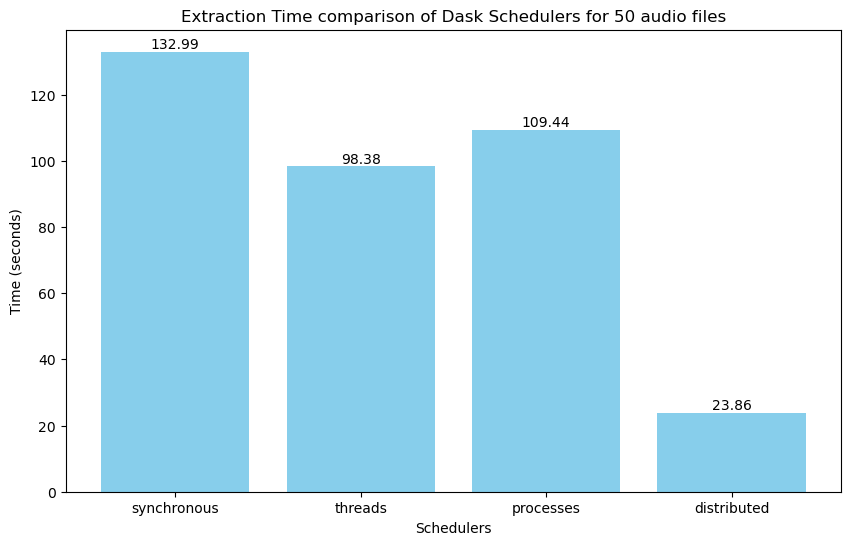

In [25]:
#Plotting the execution time comparison for each scheduler
plt.figure(figsize=(10, 6))

bars = plt.bar(schedulers, execution_times, color='skyblue')
plt.xlabel('Schedulers')
plt.ylabel('Time (seconds)')
plt.title('Extraction Time comparison of Dask Schedulers for 50 audio files')

#Displaying time on top of each bar
for bar, time_value in zip(bars, execution_times):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{time_value:.2f}', 
             ha='center', va='bottom')

plt.show()

In [26]:
#Parallel feature extraction using the Dask Distributed Scheduler
def extract_features_distributed(files, n_workers):
    cluster = LocalCluster(n_workers=n_workers)
    client = Client(cluster)
    
    res = []
    for file_path in files:
        f = delayed(extract_features)(file_path)
        res.append(f)

    extracted_features = delayed(pd.concat)(res)
    with Profiler() as prof, ResourceProfiler() as rprof, CacheProfiler() as cprof:
        df = compute(extracted_features)
    visualize([prof, rprof, cprof])
    
    client.close()
    cluster.close()
    
    return df

In [27]:
#Range of CPUs to test
num_workers = [7, 10, 14, 20, 28]

#List to store execution times
execution_times = []

#Extracting features for each configuration and recording execution time
for n_workers in num_workers:
    start = time()
    df = extract_features_distributed(files, n_workers)
    duration = time() - start
    execution_times.append(duration)
    print(f"FEATURE EXTRACTION: Number of CPUs: {n_workers}\tTime taken: {duration:.2f} seconds")

/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


FEATURE EXTRACTION: Number of CPUs: 7	Time taken: 189.41 seconds


/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


FEATURE EXTRACTION: Number of CPUs: 10	Time taken: 172.98 seconds


/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


FEATURE EXTRACTION: Number of CPUs: 14	Time taken: 163.13 seconds


/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


FEATURE EXTRACTION: Number of CPUs: 20	Time taken: 163.36 seconds


/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
2024-04-24 03:08:04,179 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most rece

FEATURE EXTRACTION: Number of CPUs: 28	Time taken: 161.63 seconds


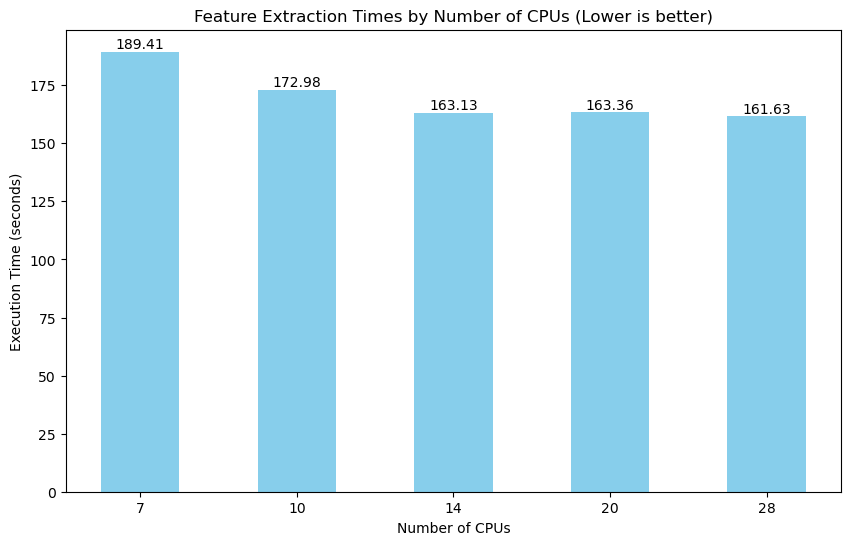

In [28]:
# Plotting execution times as a bar chart with equal spacing
plt.figure(figsize=(10, 6))
bar_width = 0.5  # Adjust the width of the bars as needed
x_ticks = np.arange(len(num_workers))  # Position of the ticks

bars = plt.bar(x_ticks, execution_times, color='skyblue', width=bar_width)
plt.xlabel('Number of CPUs')
plt.ylabel('Execution Time (seconds)')
plt.title('Feature Extraction Times by Number of CPUs (Lower is better)')
plt.xticks(x_ticks, num_workers)

# Displaying time on top of each bar
for bar, time_value in zip(bars, execution_times):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{time_value:.2f}', 
             ha='center', va='bottom')

plt.show()

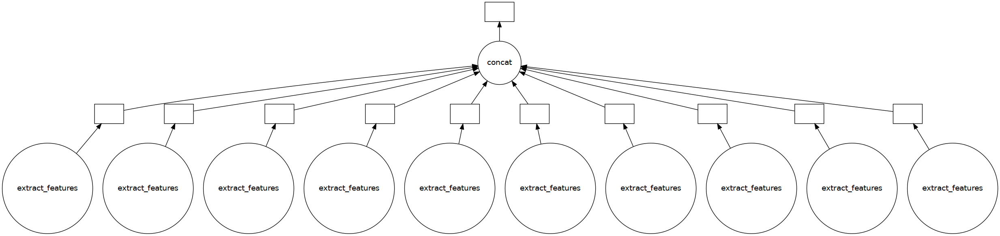

In [29]:
res = []
for file_path in files[:10]:
    f = delayed(extract_features)(file_path)
    res.append(f)

extracted_features = delayed(pd.concat)(res)
extracted_features.visualize()

<h3>Dask Task Graph</h3>

In [30]:
# Save as csv file
data = df[0]
data.to_csv(outfile_path, index=False)

<h2>Exploratory Data Analysis and Data Preprocessing</h2>

In [31]:
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

In [32]:
data = pd.read_csv(outfile_path)
data.head()

,file_name,zero_crossing_rate_mean,zero_crossings_mean,spectrogram_mean,mel_spectrogram_mean,harmonics_mean,perceptual_shock_wave_mean,spectral_centroids_mean,spectral_centroids_delta_mean,spectral_centroids_accelerate_mean,...,mfcc17_mean,mfcc_delta_17_mean,mfcc_accelerate_17_mean,mfcc18_mean,mfcc_delta_18_mean,mfcc_accelerate_18_mean,mfcc19_mean,mfcc_delta_19_mean,mfcc_accelerate_19_mean,label
0,./audio_data/blues/blues.00000.wav.0,0.082332,6056,-39.814990,-54.827530,-0.000040,-0.000030,1773.053102,-3.557564,1.037626,...,0.667902,-0.086514,-0.009320,-4.702517,-0.043107,0.034940,0.052961,0.051795,0.020322,blues
1,./audio_data/blues/blues.00000.wav.1,0.083646,6144,-35.065994,-42.183130,-0.000019,0.000049,1800.212332,5.954616,-2.629133,...,0.181143,0.150942,-0.064455,-3.860731,-0.117256,0.020957,5.638208,-0.005704,-0.037177,blues
2,./audio_data/blues/blues.00000.wav.2,0.073553,5397,-41.551838,-53.736260,-0.000081,-0.000236,1786.043927,-4.014142,0.253713,...,1.964278,0.027059,-0.033797,-1.490673,0.081831,-0.012910,3.148436,0.010370,-0.063871,blues
3,./audio_data/blues/blues.00000.wav.3,0.069974,5166,-37.317627,-46.955624,0.000001,0.000114,1683.232671,8.460039,5.451283,...,2.461084,-0.013372,0.007683,-2.774291,-0.018574,0.008530,1.257620,0.017793,0.006235,blues
4,./audio_data/blues/blues.00000.wav.4,0.082899,6094,-43.032400,-56.932766,0.000077,-0.000012,1822.230596,-2.965648,1.921806,...,0.047040,-0.193977,-0.000853,-2.677395,-0.010971,-0.004041,2.072832,-0.065389,-0.025143,blues


In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 110 entries, file_name to label
dtypes: float64(107), int64(1), object(2)
memory usage: 8.4+ MB


In [34]:
data.describe()

,zero_crossing_rate_mean,zero_crossings_mean,spectrogram_mean,mel_spectrogram_mean,harmonics_mean,perceptual_shock_wave_mean,spectral_centroids_mean,spectral_centroids_delta_mean,spectral_centroids_accelerate_mean,chroma1_mean,...,mfcc_accelerate_16_mean,mfcc17_mean,mfcc_delta_17_mean,mfcc_accelerate_17_mean,mfcc18_mean,mfcc_delta_18_mean,mfcc_accelerate_18_mean,mfcc19_mean,mfcc_delta_19_mean,mfcc_accelerate_19_mean
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.102022,6869.957300,-46.342603,-58.669761,-0.000367,-0.000400,2202.013553,0.560924,-0.151325,0.384602,...,0.022862,0.762933,0.002156,-0.010094,-2.505761,-0.006030,0.017791,-0.903098,0.001551,-0.004681
std,0.046379,3768.412195,12.946145,12.984850,0.001716,0.001145,757.048666,27.393791,11.463495,0.161178,...,0.131114,5.325632,0.285603,0.119383,5.264998,0.288778,0.122314,5.364748,0.304441,0.124514
min,0.009208,72.000000,-76.938156,-80.000010,-0.027543,-0.010181,474.261969,-388.752552,-308.937187,0.005482,...,-2.278494,-23.978693,-3.279245,-1.328251,-32.523212,-3.517795,-2.984014,-34.479450,-4.615354,-1.907927
25%,0.066268,4157.000000,-56.149235,-68.627429,-0.000146,-0.000615,1629.255143,-4.124866,-1.890516,0.273742,...,-0.014824,-2.521307,-0.057252,-0.032460,-5.762890,-0.057416,-0.016352,-4.027489,-0.057165,-0.029364
50%,0.096934,6700.000000,-47.159542,-59.341005,-0.000014,-0.000053,2208.210079,0.012406,0.233818,0.377925,...,0.013382,0.746840,-0.000546,-0.003953,-2.707061,-0.000858,0.010029,-1.013570,0.000021,-0.000869
75%,0.132314,9423.750000,-38.052657,-49.963971,0.000015,0.000025,2711.848087,4.272564,1.993417,0.485345,...,0.041081,3.910748,0.057109,0.022754,0.522258,0.056424,0.039157,2.256902,0.056065,0.027627
max,0.422514,24956.000000,-2.157479,-1.256996,0.015569,0.007007,5963.424123,480.823374,183.882980,1.000000,...,1.868440,31.772131,4.593864,1.149714,33.217632,4.641355,1.398988,34.604070,4.201602,1.182861


In [35]:
data.shape

(10000, 110)

In [36]:
data.dtypes

file_name                   object
zero_crossing_rate_mean    float64
zero_crossings_mean          int64
spectrogram_mean           float64
mel_spectrogram_mean       float64
                            ...   
mfcc_accelerate_18_mean    float64
mfcc19_mean                float64
mfcc_delta_19_mean         float64
mfcc_accelerate_19_mean    float64
label                       object
Length: 110, dtype: object

In [37]:
# Display count of data rows for each genre
genre_counts = data['label'].value_counts()
print(genre_counts)

label
blues        1000
classical    1000
country      1000
disco        1000
hiphop       1000
jazz         1000
metal        1000
pop          1000
reggae       1000
rock         1000
Name: count, dtype: int64


In [38]:
#checking for missing value
data.isna().sum()

file_name                  0
zero_crossing_rate_mean    0
zero_crossings_mean        0
spectrogram_mean           0
mel_spectrogram_mean       0
                          ..
mfcc_accelerate_18_mean    0
mfcc19_mean                0
mfcc_delta_19_mean         0
mfcc_accelerate_19_mean    0
label                      0
Length: 110, dtype: int64

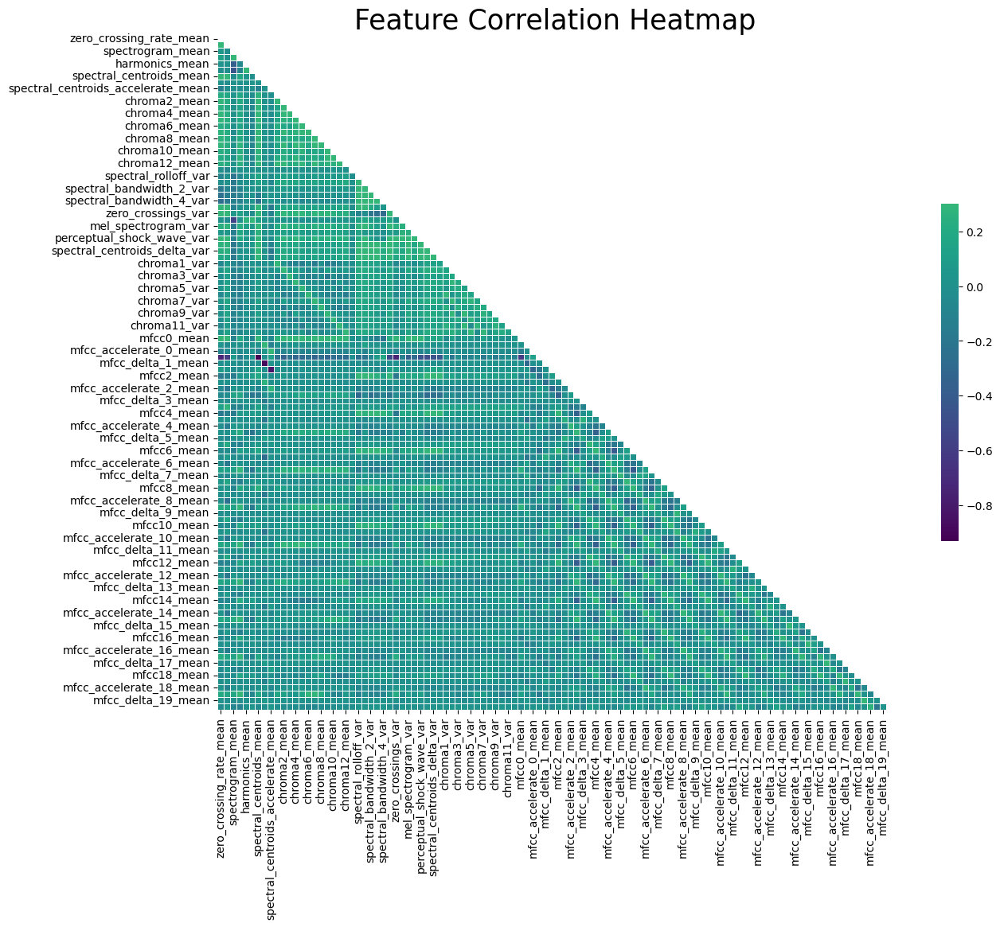

In [39]:
#Computing the correlation matrix between the features of the dataset
correlation_matrix = data.iloc[:, 1:-1].corr()

#Plot
plt.figure(figsize=(16, 11))
color_palette = sns.color_palette("viridis", as_cmap=True)

#Drawing the heatmap
sns.heatmap(correlation_matrix, cmap=color_palette, mask=np.triu(correlation_matrix), vmax=0.3, center=0, square=True, linewidths=0.5, cbar_kws={"shrink":0.5})

plt.title('Feature Correlation Heatmap', fontsize=25)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.savefig("Feature_Correlation_Heatmap.jpg")
plt.show()

In [40]:
#Splitting data into features(X) and target (y)
target_column = 'label'
features = data.drop(columns=[target_column, 'file_name'])
target = data[target_column]

# Standardizing features to have a mean of 0 and variance of 1
scaler = StandardScaler()
features_normalized_df = scaler.fit_transform(features.astype(float))

#Updating variables for clarity
X = features_normalized_df
y = target

In [41]:
#Encoding target labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [42]:
X

array([[-0.42458098, -0.21600556,  0.50423811, ...,  0.17822031,
         0.16504309,  0.20081368],
       [-0.39623476, -0.19265239,  0.87108349, ...,  1.21937396,
        -0.02383324, -0.26099161],
       [-0.61387483, -0.39088902,  0.37007193, ...,  0.75525206,
         0.02896909, -0.47539512],
       ...,
       [ 0.5801269 ,  0.69052234, -1.14747861, ...,  0.05748706,
         0.00921828, -0.3281985 ],
       [-0.86111278, -0.61009044, -0.90293629, ..., -0.32913424,
        -0.17464666,  0.26249458],
       [-0.21146367, -1.63630338, -0.34923445, ..., -0.70472194,
        -0.9961651 ,  2.60094443]])

In [43]:
#70-30 split
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42, stratify=y)

In [44]:
len(y_train)

7000

In [45]:
len(y_test)

3000

<h2>Training and Classifying</h2>

In [46]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, classification_report
from sklearn.feature_selection import RFE

import xgboost.dask as bst
import xgboost as xgb

In [47]:
def evaluate_model(model, model_name = "", cr = False):
    model.fit(X_train, y_train)
    y_hat = model.predict(X_test)
    print('Accuracy', model_name, ':', round(accuracy_score(y_test, y_hat), 5), '\n')
    if cr:
        target_names = sorted(set(label_encoder.inverse_transform(y_encoded)))
        print(classification_report(y_test, y_hat, target_names=target_names))

In [48]:
knn = KNeighborsClassifier(n_neighbors=19)
evaluate_model(knn, "KNN")

rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
evaluate_model(rforest, "Random Forest")

svm = SVC(decision_function_shape="ovo")
evaluate_model(svm, "SVM")

xgb = XGBClassifier(n_estimators=1000)
evaluate_model(xgb, "XGBoost Classifier")

Accuracy KNN : 0.76533 

Accuracy Random Forest : 0.796 

Accuracy SVM : 0.79767 

Accuracy XGBoost Classifier : 0.88067 



In [49]:
model = XGBClassifier(n_estimators=1000)
model.fit(X_train, y_train, eval_metric='merror')

/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [50]:
from sklearn.metrics import classification_report

#Predictions on the training set
train_predictions = model.predict(X_train)
print("Training set predictions:", train_predictions)

#Predictions on the testing set
test_predictions = model.predict(X_test)
print("Testing set predictions:", test_predictions)

target_names = sorted(set(label_encoder.inverse_transform(y_encoded)))

#Training accuracy
training_accuracy = accuracy_score(y_train, train_predictions)
print(f'Training accuracy: {training_accuracy}')

#Classification report for the training set
print("Training Classification Report:")
train_classification_report = classification_report(y_train, train_predictions, target_names=target_names)
print(train_classification_report)

#Testing accuracy
testing_accuracy = accuracy_score(y_test, test_predictions)
print(f'Testing accuracy: {testing_accuracy}')

#Classification report for the testing set
print("Testing Classification Report:")
test_classification_report = classification_report(y_test, test_predictions, target_names=target_names)
print(test_classification_report)

Training set predictions: [8 2 0 ... 3 0 7]
Testing set predictions: [1 2 6 ... 6 3 4]
Training accuracy: 0.9992857142857143
Training Classification Report:
              precision    recall  f1-score   support

       blues       1.00      1.00      1.00       700
   classical       1.00      1.00      1.00       700
     country       1.00      1.00      1.00       700
       disco       1.00      1.00      1.00       700
      hiphop       1.00      1.00      1.00       700
        jazz       1.00      1.00      1.00       700
       metal       1.00      1.00      1.00       700
         pop       1.00      1.00      1.00       700
      reggae       1.00      1.00      1.00       700
        rock       1.00      1.00      1.00       700

    accuracy                           1.00      7000
   macro avg       1.00      1.00      1.00      7000
weighted avg       1.00      1.00      1.00      7000

Testing accuracy: 0.8806666666666667
Testing Classification Report:
              pr

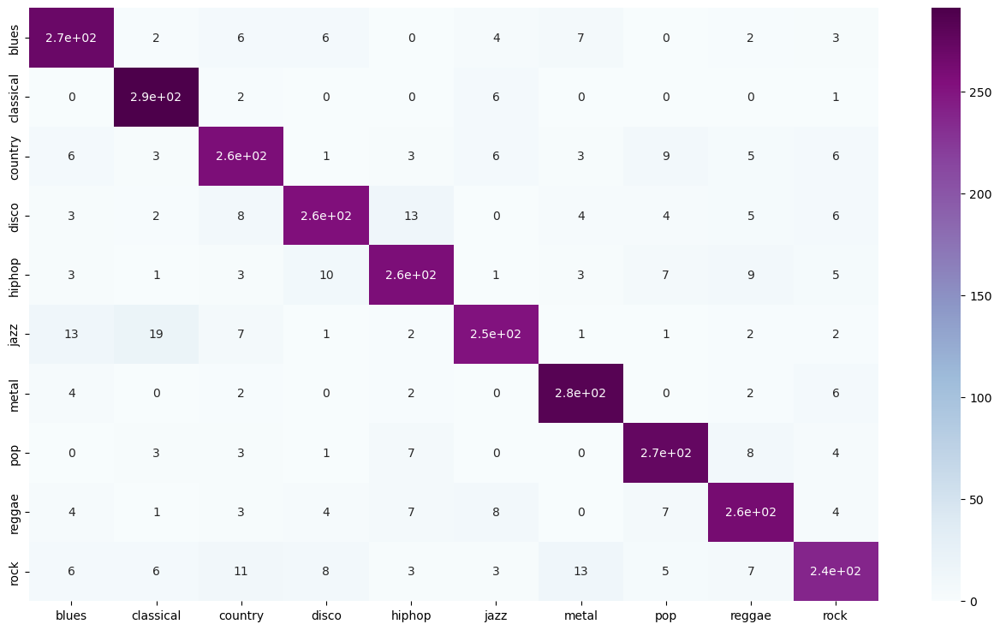

In [51]:
# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, test_predictions)

# Setting up the plot figure
plt.figure(figsize=(16, 9))

# Plotting the heatmap
plt_labels = sorted(set(y))
sns.heatmap(conf_matrix, cmap="BuPu", annot=True, xticklabels=plt_labels, yticklabels=plt_labels)

# Show plot
plt.show()

<h2>Testing parallelization for model training</h2>

In [52]:
from joblib import parallel_backend
from dask.distributed import Client
from dask import array as da

In [53]:
# serial execution time for baseline
start = time()
model = XGBClassifier(n_estimators=1000)
evaluate_model(model)
serial_execution_time = time()-start
print(f'serial XGBoost on took {serial_execution_time} seconds')

Accuracy  : 0.88067 

serial XGBoost on took 17.729092121124268 seconds


<h3>Try Dask for parallelization</h3>

In [54]:
# dict to hold execution times with number of cpu as key
dask_parallel_times = {}
# create dask array with appropriate chunk size
da_X_train, da_y_train = da.from_array(X_train, chunks=(1000,108)), da.from_array(y_train, chunks=(1000,))
da_X_test, da_y_test = da.from_array(X_test, chunks=(100,108)), da.from_array(y_test, chunks=(100))
da_X_train

dask.array<array, shape=(7000, 108), dtype=float64, chunksize=(1000, 108), chunktype=numpy.ndarray>

In [55]:
start = time()
with Client(n_workers=2) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[2] = duration
print(f'Dask XGBoost on 2 CPUs took {duration} seconds')

Dask XGBoost on 2 CPUs took 21.94645071029663 seconds


In [56]:
start = time()
with Client(n_workers=4) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[4] = duration
print(f'Dask XGBoost on 4 CPUs took {duration} seconds')

Dask XGBoost on 4 CPUs took 20.87785577774048 seconds


In [57]:
start = time()
with Client(n_workers=7) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[7] = duration
print(f'Dask XGBoost on 7 CPUs took {duration} seconds')

Dask XGBoost on 7 CPUs took 21.32378911972046 seconds


In [58]:
start = time()
with Client(n_workers=14) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[14] = duration
print(f'Dask XGBoost on 14 CPUs took {duration} seconds')

Dask XGBoost on 14 CPUs took 23.5819149017334 seconds


In [59]:
start = time()
with Client(n_workers=21) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[21] = duration
print(f'Dask XGBoost on 21 CPUs took {duration} seconds')

Dask XGBoost on 21 CPUs took 25.359222412109375 seconds


In [60]:
start = time()
with Client(n_workers=28) as client:
    model = XGBClassifier(n_estimators=1000)
    model.client = client
    model.fit(da_X_train, da_y_train)
duration = time()-start
dask_parallel_times[28] = duration
print(f'Dask XGBoost on 28 CPUs took {duration} seconds')

2024-04-24 03:12:27,914 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/distributed/worker.py", line 1252, in heartbeat
    response = await retry_operation(
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/distributed/utils_comm.py", line 455, in retry_operation
    return await retry(
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-packages/distributed/utils_comm.py", line 434, in retry
    return await coro()
  File "/home/gade.as/.conda/envs/project/lib/python3.9/site-package

Dask XGBoost on 28 CPUs took 28.64093828201294 seconds


<h3>Try Joblib for parallelization</h3>

In [61]:
joblib_parallel_times = {}

In [62]:
start = time()
with parallel_backend('threading', n_jobs=2):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[2] = duration
print(f'joblib XGBoost on 2 CPUs took {duration} seconds')

joblib XGBoost on 2 CPUs took 17.86368727684021 seconds


In [63]:
start = time()
with parallel_backend('threading', n_jobs=4):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[4] = duration
print(f'joblib XGBoost on 4 CPUs took {duration} seconds')

joblib XGBoost on 4 CPUs took 17.204279899597168 seconds


In [64]:
start = time()
with parallel_backend('threading', n_jobs=7):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[7] = duration
print(f'joblib XGBoost on 7 CPUs took {duration} seconds')

joblib XGBoost on 7 CPUs took 17.564738273620605 seconds


In [65]:
start = time()
with parallel_backend('threading', n_jobs=14):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[14] = duration
print(f'joblib XGBoost on 14 CPUs took {duration} seconds')

joblib XGBoost on 14 CPUs took 17.35850977897644 seconds


In [66]:
start = time()
with parallel_backend('threading', n_jobs=21):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[21] = duration
print(f'joblib XGBoost on 21 CPUs took {duration} seconds')

joblib XGBoost on 21 CPUs took 17.313105583190918 seconds


In [67]:
start = time()
with parallel_backend('threading', n_jobs=28):
    model = XGBClassifier(n_estimators=1000)
    model.fit(X_train, y_train)
duration = time()-start
joblib_parallel_times[28] = duration
print(f'joblib XGBoost on 28 CPUs took {duration} seconds')

joblib XGBoost on 28 CPUs took 17.5698082447052 seconds


In [68]:
#finding the min times among dask and joblib
fastest_dask = min(dask_parallel_times, key=dask_parallel_times.get)
fastest_joblib = min(joblib_parallel_times, key=joblib_parallel_times.get)
fastest_parallel = min(dask_parallel_times.get(fastest_dask), dask_parallel_times.get(fastest_joblib))
fastest_cpu = -1
if fastest_parallel == dask_parallel_times.get(fastest_dask):
    fastest_cpu = fastest_dask
else:
    fastest_cpu = fastest_joblib

In [69]:
#Calculating the speedup achieved by using parallel on xgboost
speedup = {}
speedup_xgboost = serial_execution_time / fastest_parallel

print("Speedup achieved for xgboost training: ", round(speedup_xgboost,2),"X")

# #Calculating the efficiency achieved by using parallel on feature extraction
efficiency_xgboost = speedup_xgboost / fastest_cpu

print("Efficiency achieved for xgboost training: ", round(efficiency_xgboost,2), "%")

Speedup achieved for xgboost training:  0.85 X
Efficiency achieved for xgboost training:  0.21 %


In [70]:
execution_times = []
cpus = []
for key in joblib_parallel_times:
    cpus.append(key)
    execution_times.append(joblib_parallel_times.get(key))

In [71]:
print(dask_parallel_times)
print(joblib_parallel_times)

{2: 21.94645071029663, 4: 20.87785577774048, 7: 21.32378911972046, 14: 23.5819149017334, 21: 25.359222412109375, 28: 28.64093828201294}
{2: 17.86368727684021, 4: 17.204279899597168, 7: 17.564738273620605, 14: 17.35850977897644, 21: 17.313105583190918, 28: 17.5698082447052}


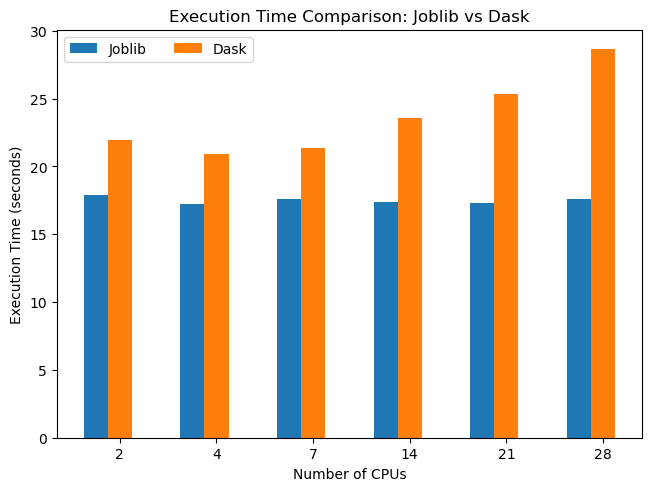

In [72]:
num_cpus = joblib_parallel_times.keys()
parallel_techniques = {
    'Joblib': joblib_parallel_times.values(),
    'Dask': dask_parallel_times.values(),
}

x = np.arange(len(num_cpus))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, exec_time in parallel_techniques.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, exec_time, width, label=attribute)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Number of CPUs')
ax.set_ylabel('Execution Time (seconds)')
ax.set_title('Execution Time Comparison: Joblib vs Dask')
ax.set_xticks(x + width, num_cpus)
ax.legend(loc='upper left', ncols=2)

plt.show()

<h2>Tuning XGBoost Model</h2>

In [73]:
from dask_ml.model_selection import GridSearchCV
from joblib import parallel_backend

In [74]:
X_train = pd.DataFrame(X_train)
y_train = pd.Series(y_train)

dd_X_train = dd.from_pandas(X_train, npartitions=4)
dd_y_train = dd.from_pandas(y_train, npartitions=4)

In [75]:
xgb = XGBClassifier(n_estimators=1000)

In [76]:
param_grid = {
    'learning_rate': [0.05, 0.1, 0.2],
}

In [77]:
grid_search = GridSearchCV(xgb, param_grid, cv=3)
with Client(n_workers=16) as client:
    grid_search.fit(dd_X_train, dd_y_train)

2024-04-24 03:22:18,056 - distributed.scheduler - WARNING - Detected different `run_spec` for key '_indexable-09f97c7df4749c11656688e93d02a743' between two consecutive calls to `update_graph`. This can cause failures and deadlocks down the line. Please ensure unique key names. If you are using a standard dask collections, consider releasing all the data before resubmitting another computation. More details and help can be found at https://github.com/dask/dask/issues/9888. 
Debugging information
---------------------
old task state: released
old run_spec: (<function _indexable at 0x2b347ad1bca0>, ('finalize-f283ff9f-4c8d-4c10-91ef-06db87c5675b',), {})
new run_spec: (<function _indexable at 0x2b347ad1bca0>, ('finalize-1aa8f459-0a3a-4437-b59d-9fd648710fbf',), {})
old token: ('tuple', [('08a73b82b61f2ab8b68d8b7234df74eac8237585', []), ('tuple', ['finalize-f283ff9f-4c8d-4c10-91ef-06db87c5675b']), ('dict', [])])
new token: ('tuple', [('08a73b82b61f2ab8b68d8b7234df74eac8237585', []), ('tuple'

In [78]:
model = XGBClassifier(n_estimators=1000, learning_rate=0.05)
evaluate_model(model)

Accuracy  : 0.889 

